# About the Notebook
This notebook shows the workflow to build the models used to predict noise. At the end it is also shown the prediction of new locations using the model.

# Import Packages

In [1]:
import pandas as pd
import numpy as np
from holidays_co import get_colombia_holidays_by_year

In [2]:
import seaborn
seaborn.set_style("whitegrid")
import matplotlib.pyplot as plt
import numpy

In [3]:
festivos = pd.DataFrame()
for a in [2019,2020,2021]:
    holidays = pd.DataFrame(get_colombia_holidays_by_year(a))
    festivos = festivos.append(holidays)

In [4]:
interim_path = '../data/interim/'

In [5]:
pd.set_option('display.max_rows', None)

In [6]:
otros_path = '../data/otros/'

# Read New Variables

In [7]:
nuevas_variables = pd.read_csv(interim_path + "nuevas_variables.csv")

In [8]:
nuevas_variables.head()

,Estación,latitud,longitud,lat_lon,conteo_bares_500m,conteo_bares_1km,conteo_bares_2km,conteo_colegios_500m,conteo_colegios_1km,conteo_colegios_2km,...,TP9_3_4_NO,TP9_3_5_NO,TP9_3_6_NO,TP9_3_7_NO,TP9_3_8_NO,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TP9_4_USO,TVIVIENDA
0,CAI 20 de Julio,4.572611,-74.092556,"('4.5726111', '-74.09255556')",0.0,0.0,0.0,14.0,47.0,142.0,...,0.0,15.0,10.0,7.0,0.0,4.0,0.0,1049.0,0.0,3743.0
1,CAI 7 de Agosto,4.658056,-74.076944,"('4.658055556', '-74.07694444')",0.0,0.0,14.0,4.0,17.0,97.0,...,0.0,12.0,0.0,1.0,0.0,3.0,0.0,1672.0,0.0,3053.0
2,CAI Alamos,4.690161,-74.117250,"('4.6901611', '-74.11725')",0.0,1.0,21.0,0.0,11.0,104.0,...,0.0,1.0,10.0,4.0,0.0,2.0,0.0,396.0,0.0,1398.0
3,CAI Americas,4.619192,-74.139075,"('4.6191917', '-74.139075')",16.0,17.0,17.0,8.0,25.0,122.0,...,0.0,17.0,5.0,8.0,0.0,2.0,0.0,789.0,0.0,2822.0
4,CAI Aurora,4.519842,-74.121650,"('4.5198417', '-74.12165')",0.0,0.0,0.0,9.0,17.0,45.0,...,0.0,20.0,14.0,31.0,0.0,0.0,0.0,438.0,0.0,8231.0


# SDA Datasets

In [9]:
#SDA_fecha_hora = pd.read_csv(otros_path + 'df_group_fecha_hora.csv',sep=';')

In [10]:
SDA_fecha_hora = pd.read_csv(otros_path + 'cleaned_data/df_group_fecha_hora.csv',sep=';')

In [11]:
SDA_fecha_hora = SDA_fecha_hora[SDA_fecha_hora.Origen == 'SDA']

In [12]:
SDA_fecha_hora= SDA_fecha_hora[SDA_fecha_hora.Variable=='Leq']

In [13]:
SDA_fecha_hora.head()

,Componente,Estación,Variable,Date_no_hour,Hora,Valor_max,Valor_mean,Valor_median,Valor_min,max-min,nombre corto,latitud,longitud,altitud,altura suelo,Origen
48988,Ruido,CAI 20 de Julio,Leq,2019-04-10,0,65.3,64.20,64.20,63.1,2.2,CAI20JUL,4.572611,-74.092556,NaN,NaN,SDA
48989,Ruido,CAI 20 de Julio,Leq,2019-04-10,1,65.1,63.80,63.80,62.5,2.6,CAI20JUL,4.572611,-74.092556,NaN,NaN,SDA
48990,Ruido,CAI 20 de Julio,Leq,2019-04-10,2,65.2,64.25,64.25,63.3,1.9,CAI20JUL,4.572611,-74.092556,NaN,NaN,SDA
48991,Ruido,CAI 20 de Julio,Leq,2019-04-10,3,67.4,66.45,66.45,65.5,1.9,CAI20JUL,4.572611,-74.092556,NaN,NaN,SDA
48992,Ruido,CAI 20 de Julio,Leq,2019-04-10,4,69.3,68.25,68.25,67.2,2.1,CAI20JUL,4.572611,-74.092556,NaN,NaN,SDA


In [14]:
SDA_fecha_hora = SDA_fecha_hora.drop(['latitud','longitud','altitud','altura suelo','Origen'],axis=1)

In [15]:
SDA_fecha_hora.Date_no_hour.min()

'2017-06-30'

In [16]:
SDA_fecha_hora.Date_no_hour.max()

'2020-08-07'

# Merge

In [17]:
merged_df_leq = SDA_fecha_hora.merge(nuevas_variables,how='left',on='Estación')

In [18]:
#merged_df_leq= merged_df[merged_df.Variable=='Leq']

In [19]:
del(SDA_fecha_hora)
del(nuevas_variables)

In [20]:
merged_df_leq["Fecha"] = pd.to_datetime(merged_df_leq.Date_no_hour).apply(lambda x: x.date())

In [21]:
merged_df_leq['weekday'] = pd.to_datetime(merged_df_leq.Date_no_hour).dt.dayofweek + 1

In [22]:
merged_df_leq['weekday']  = (merged_df_leq
                                    .apply(lambda x: -1 if x['Date_no_hour'] in festivos.date.values else x['weekday'],
                                           axis=1)
                                    )

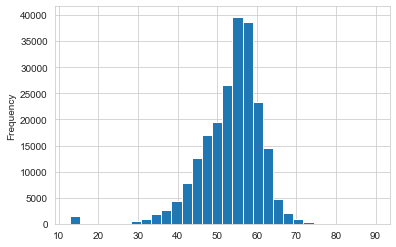

In [23]:
merged_df_leq.Valor_mean.plot(kind='hist',bins=30)

In [24]:
merged_df_leq_not_na = merged_df_leq.dropna()

In [25]:
merged_df_leq_not_na = merged_df_leq_not_na[(
    (merged_df_leq_not_na.Valor_mean > 20) &
    (merged_df_leq_not_na.Valor_mean < 80))]

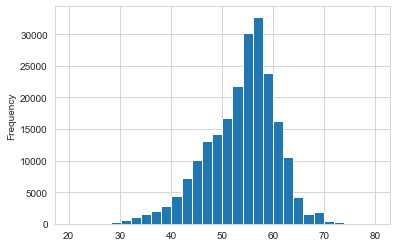

In [26]:
merged_df_leq_not_na.Valor_mean.plot(kind='hist',bins=30)

## Filter outliers

In [27]:
len(merged_df_leq_not_na)

218510

In [28]:
outlierConstant = 1.5
merged_df_leq_not_na_outliers = pd.DataFrame()

for station in merged_df_leq_not_na.Estación.unique():
    estacion_df = merged_df_leq_not_na[merged_df_leq_not_na.Estación == station ]
    upper_quartile = np.percentile(estacion_df.Valor_mean, 75)
    lower_quartile = np.percentile(estacion_df.Valor_mean, 25)

    IQR = (upper_quartile - lower_quartile) * outlierConstant

    quartileSet = (lower_quartile - IQR, upper_quartile + IQR)

    cleaned_estacion_df = estacion_df[((estacion_df.Valor_mean >= quartileSet[0])&(estacion_df.Valor_mean <= quartileSet[1]))]
    
    merged_df_leq_not_na_outliers = pd.concat([merged_df_leq_not_na_outliers,cleaned_estacion_df])

In [29]:
len(merged_df_leq_not_na_outliers)

210716

In [30]:
merged_df_leq_not_na = merged_df_leq_not_na_outliers

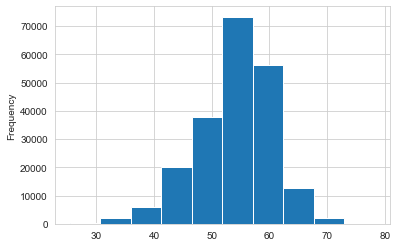

In [31]:
merged_df_leq_not_na_outliers.Valor_mean.plot(kind='hist')

## Correlations

In [32]:
descriptive =merged_df_leq_not_na.describe().T

In [33]:
descriptive

,count,mean,std,min,25%,50%,75%,max
Hora,210716.0,1.177113e+01,6.812803e+00,0.000000,6.000000e+00,1.200000e+01,1.800000e+01,2.300000e+01
Valor_max,210716.0,6.814100e+01,6.030125e+00,37.700000,6.480000e+01,6.920000e+01,7.230000e+01,9.840000e+01
Valor_mean,210716.0,5.403870e+01,6.509223e+00,25.441176,5.013824e+01,5.509412e+01,5.834118e+01,7.820000e+01
Valor_median,210716.0,5.677320e+01,6.125061e+00,26.350000,5.310000e+01,5.790000e+01,6.110000e+01,7.820000e+01
Valor_min,210716.0,2.541319e+01,1.198611e+01,0.000000,1.860000e+01,2.380000e+01,2.890000e+01,7.640000e+01
max-min,210716.0,4.272782e+01,1.200013e+01,0.000000,4.190000e+01,4.480000e+01,4.790000e+01,8.420000e+01
latitud,210716.0,4.656376e+00,5.305836e-02,4.519842,4.608889e+00,4.668889e+00,4.699756e+00,4.753056e+00
longitud,210716.0,-7.409694e+01,3.549751e-02,-74.175614,-7.412730e+01,-7.410027e+01,-7.406568e+01,-7.402258e+01
conteo_bares_500m,210716.0,4.121396e+00,1.317425e+01,0.000000,0.000000e+00,0.000000e+00,1.000000e+00,7.000000e+01
conteo_bares_1km,210716.0,6.349347e+00,1.561634e+01,0.000000,0.000000e+00,0.000000e+00,4.000000e+00,8.100000e+01


In [34]:
correlations = merged_df_leq_not_na.corr()

In [35]:
correlations.style.background_gradient(cmap='coolwarm').set_precision(2)

C:\Users\dspinzon\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
C:\Users\dspinzon\Anaconda3\lib\site-packages\pandas\io\formats\style.py:1089: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(s.to_numpy()) if vmin is None else vmin
C:\Users\dspinzon\Anaconda3\lib\site-packages\pandas\io\formats\style.py:1090: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(s.to_numpy()) if vmax is None else vmax


# Split the data

In [36]:
from sklearn.model_selection import train_test_split

In [37]:
# Split Train, and Test Data
leq_train, leq_test, data_target_train, data_target_test = train_test_split(merged_df_leq_not_na,merged_df_leq_not_na.Valor_mean, test_size=0.2, random_state=123)

In [38]:
leq_train.shape

(168572, 112)

In [39]:
data_target_train.shape

(168572,)

In [40]:
leq_test.shape

(42144, 112)

In [41]:
 data_target_test.shape

(42144,)

In [42]:
features_list = [
    'Hora', 'latitud', 'longitud', 'weekday', 'conteo_bares_500m',
    'conteo_bares_1km', 'conteo_bares_2km', 'conteo_colegios_500m',
    'conteo_colegios_1km', 'conteo_colegios_2km', 'conteo_hoteles_500m',
    'conteo_hoteles_1km', 'conteo_hoteles_2km', 'conteo_ips_500m',
    'conteo_ips_1km', 'conteo_ips_2km', 'AREA', 'CTNENCUEST', 'DENSIDAD',
    'OBJECTID_1', 'OID', 'PERSONAS_L', 'PERSONAS_S', 'TP14_1_TIP',
    'TP14_2_TIP', 'TP14_3_TIP', 'TP14_4_TIP', 'TP14_5_TIP', 'TP14_6_TIP',
    'TP15_1_OCU', 'TP15_2_OCU', 'TP15_3_OCU', 'TP15_4_OCU', 'TP16_HOG',
    'TP19_ACU_1', 'TP19_ACU_2', 'TP19_ALC_1', 'TP19_ALC_2', 'TP19_EE_1',
    'TP19_EE_2', 'TP19_EE_E1', 'TP19_EE_E2', 'TP19_EE_E3', 'TP19_EE_E4',
    'TP19_EE_E5', 'TP19_EE_E6', 'TP19_EE_E9', 'TP19_GAS_1', 'TP19_GAS_2',
    'TP19_GAS_9', 'TP19_INTE1', 'TP19_INTE2', 'TP19_INTE9', 'TP19_RECB1',
    'TP19_RECB2', 'TP27_PERSO', 'TP32_1_SEX', 'TP32_2_SEX', 'TP34_1_EDA',
    'TP34_2_EDA', 'TP34_3_EDA', 'TP34_4_EDA', 'TP34_5_EDA', 'TP34_6_EDA',
    'TP34_7_EDA', 'TP34_8_EDA', 'TP34_9_EDA', 'TP3A_RI', 'TP3B_TCN',
    'TP3_1_SI', 'TP3_2_NO', 'TP4_1_SI', 'TP4_2_NO', 'TP51POSTGR', 'TP51PRIMAR',
    'TP51SECUND', 'TP51SUPERI', 'TP51_13_ED', 'TP51_99_ED', 'TP9_1_USO',
    'TP9_2_1_MI', 'TP9_2_2_MI', 'TP9_2_3_MI', 'TP9_2_4_MI', 'TP9_2_9_MI',
    'TP9_2_USO', 'TP9_3_10_N', 'TP9_3_1_NO', 'TP9_3_2_NO', 'TP9_3_3_NO',
    'TP9_3_4_NO', 'TP9_3_5_NO', 'TP9_3_6_NO', 'TP9_3_7_NO', 'TP9_3_8_NO',
    'TP9_3_99_N', 'TP9_3_9_NO', 'TP9_3_USO', 'TP9_4_USO', 'TVIVIENDA'
]

In [43]:
not_useful = ['TP9_4_USO','TP9_2_4_MI','TP3A_RI','TP3B_TCN','TP3_1_SI','PERSONAS_L']

In [44]:
features_list  = [x for x in features_list if x not in not_useful]

In [45]:
data_features_train =leq_train[features_list]
data_features_test =leq_test[features_list]

# Linear Model

In [46]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn import datasets, linear_model
from sklearn.metrics import mean_squared_error, r2_score
import statsmodels.api as sm

In [47]:
mod1 = sm.OLS(data_target_train.astype(float), data_features_train.astype(float))
test_linearR_sm = mod1.fit()

In [48]:
test_linearR_sm.summary2()

<class 'statsmodels.iolib.summary2.Summary'>
"""
                   Results: Ordinary least squares
======================================================================
Model:                OLS              Adj. R-squared:     0.593      
Dependent Variable:   Valor_mean       AIC:                958199.2780
Date:                 2020-11-13 08:17 BIC:                958500.3316
No. Observations:     168572           Log-Likelihood:     -4.7907e+05
Df Model:             29               F-statistic:        8476.      
Df Residuals:         168542           Prob (F-statistic): 0.00       
R-squared:            0.593            Scale:              17.222     
----------------------------------------------------------------------
                      Coef.  Std.Err.     t     P>|t|   [0.025  0.975]
----------------------------------------------------------------------
Hora                  0.1953   0.0015  131.6531 0.0000  0.1924  0.1982
latitud               0.0005   0.0000  349.0602 0.0000  0.0005  0.0005
longitud             -0.0077   0.0000 -359.0325 0.0000 -0.0077 -0.0076
weekday              -0.0854   0.0051  -16.8891 0.0000 -0.0953 -0.0755
conteo_bares_500m     0.0039   0.0000  104.1026 0.0000  0.0038  0.0040
conteo_bares_1km      0.0074   0.0001  132.0255 0.0000  0.0073  0.0076
conteo_bares_2km      0.0187   0.0001  178.1351 0.0000  0.0185  0.0189
conteo_colegios_500m -0.0073   0.0001 -131.6583 0.0000 -0.0074 -0.0072
conteo_colegios_1km  -0.0149   0.0001 -150.0595 0.0000 -0.0151 -0.0147
conteo_colegios_2km  -0.0040   0.0001  -59.3770 0.0000 -0.0042 -0.0039
conteo_hoteles_500m   0.0041   0.0000  128.8259 0.0000  0.0040  0.0042
conteo_hoteles_1km    0.0163   0.0001  150.8256 0.0000  0.0161  0.0165
conteo_hoteles_2km    0.0393   0.0003  149.0893 0.0000  0.0388  0.0398
conteo_ips_500m       0.0012   0.0001   15.5815 0.0000  0.0011  0.0014
conteo_ips_1km        0.0116   0.0002   74.8877 0.0000  0.0113  0.0119
conteo_ips_2km        0.0136   0.0001  100.6579 0.0000  0.0134  0.0139
AREA                  0.0000   0.0000  410.6143 0.0000  0.0000  0.0000
CTNENCUEST            0.0034   0.0000  128.8101 0.0000  0.0033  0.0034
DENSIDAD             -0.0004   0.0000 -133.9691 0.0000 -0.0004 -0.0004
OBJECTID_1           -0.0000   0.0000 -176.2953 0.0000 -0.0000 -0.0000
OID                  -0.0000   0.0000 -176.2953 0.0000 -0.0000 -0.0000
PERSONAS_S           -0.0040   0.0000 -116.4068 0.0000 -0.0041 -0.0039
TP14_1_TIP            0.0176   0.0001  145.6318 0.0000  0.0174  0.0178
TP14_2_TIP           -0.0076   0.0000 -168.4422 0.0000 -0.0077 -0.0075
TP14_3_TIP           -0.0045   0.0001  -30.3540 0.0000 -0.0048 -0.0043
TP14_4_TIP           -0.0001   0.0000  -97.6830 0.0000 -0.0001 -0.0001
TP14_5_TIP            0.0000   0.0000   18.4410 0.0000  0.0000  0.0000
TP14_6_TIP           -0.0059   0.0000 -182.9778 0.0000 -0.0060 -0.0059
TP15_1_OCU            0.0141   0.0001  155.8016 0.0000  0.0139  0.0142
TP15_2_OCU           -0.0356   0.0002 -175.4372 0.0000 -0.0360 -0.0352
TP15_3_OCU           -0.0073   0.0001  -74.2615 0.0000 -0.0075 -0.0071
TP15_4_OCU            0.0284   0.0002  169.3678 0.0000  0.0281  0.0288
TP16_HOG             -0.0276   0.0001 -197.4376 0.0000 -0.0278 -0.0273
TP19_ACU_1            0.0101   0.0001  157.5115 0.0000  0.0100  0.0102
TP19_ACU_2            0.0040   0.0000  131.6123 0.0000  0.0039  0.0040
TP19_ALC_1            0.0067   0.0000  137.8132 0.0000  0.0066  0.0068
TP19_ALC_2            0.0073   0.0000  159.7412 0.0000  0.0072  0.0074
TP19_EE_1             0.0122   0.0001  178.3472 0.0000  0.0120  0.0123
TP19_EE_2             0.0019   0.0000   79.9469 0.0000  0.0018  0.0019
TP19_EE_E1            0.0277   0.0002  145.9229 0.0000  0.0273  0.0281
TP19_EE_E2           -0.0026   0.0001  -46.1352 0.0000 -0.0027 -0.0025
TP19_EE_E3           -0.0061   0.0000 -204.1158 0.0000 -0.0062 -0.0060
TP19_EE_E4           -0.0093   0.0001 -153.3904 0.0000 -0.0094 -0.0092
TP19_EE_E5           -0.0071   0.0001  -98.9346 0.0000 -0.0073 -0.

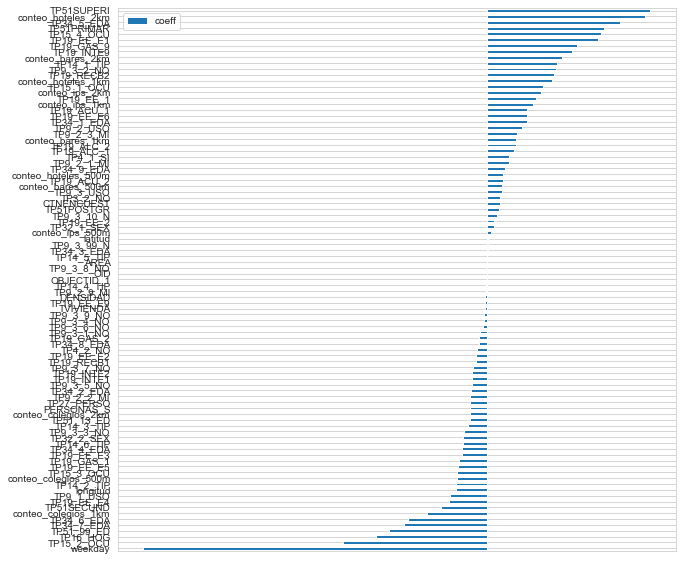

In [49]:
coefs1 = pd.DataFrame(test_linearR_sm.params)

coefs1.columns = ['coeff']

coefs1[1:].sort_values('coeff').plot.barh(figsize=(10,10))
plt.xticks(())
plt.show()

In [50]:
regr = linear_model.LinearRegression()

In [51]:
regr.fit(data_features_train.astype(float),data_target_train.astype(float))

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [52]:
ruido_pred = regr.predict(data_features_train.astype(float))

In [154]:
# Make predictions using the train set
ruido_pred_train_reg = regr.predict(data_features_train.astype(float))

In [155]:
# Make predictions using the test set
ruido_pred_test_reg = regr.predict(data_features_test.astype(float))

In [156]:
print('Train performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_train, ruido_pred_train_reg))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_train, ruido_pred_train_reg,squared=False))
rmse_pct = mean_squared_error(data_target_train, ruido_pred_train_reg,squared=False)/data_target_train.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_train, ruido_pred_train_reg))

print('--------------------------')
print('Test performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_test, ruido_pred_test_reg))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_test, ruido_pred_test_reg,squared=False))
rmse_pct = mean_squared_error(data_target_test, ruido_pred_test_reg,squared=False)/data_target_test.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_test, ruido_pred_test_reg))

Train performance:
Mean squared error: 17.22
RMSE: 4.15
RMSE percentage: 7.68 
R2: 0.59
--------------------------
Test performance:
Mean squared error: 17.19
RMSE: 4.15
RMSE percentage: 7.67 
R2: 0.60


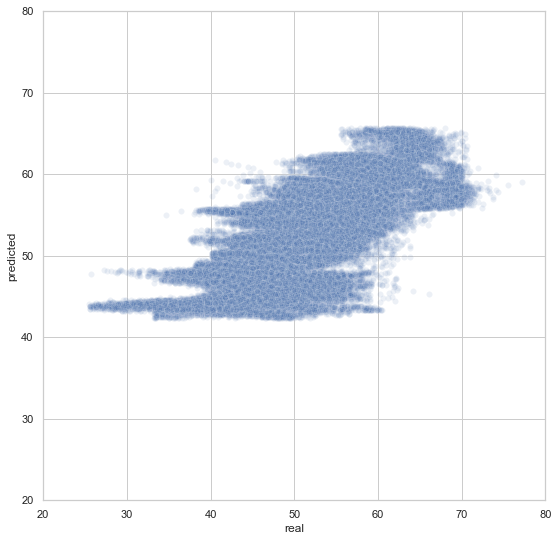

In [54]:
seaborn.set(rc={'figure.figsize':(9,9)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_train.values,ruido_pred,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

# Decission Tree

In [55]:
from sklearn.tree import DecisionTreeRegressor, plot_tree

In [56]:
from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

C:\Users\dspinzon\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


In [57]:
len(data_features_train)*0.005

842.86

In [128]:
tree =DecisionTreeRegressor(#criterion='mse', 
                              #splitter='best', 
                              max_depth=10, 
                              #min_samples_split=10, 
                              min_samples_leaf=900,
                              #min_weight_fraction_leaf=0.0, 
                              max_features=None, 
                              random_state=0, 
                              #max_leaf_nodes=None, 
                              #min_impurity_decrease=0.0, 
                              #min_impurity_split=None, 
                              #presort='deprecated', 
                              #ccp_alpha=0.0
                             )

In [129]:
tree.fit(data_features_train.astype(float),data_target_train.astype(float))

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=10,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=900, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=0, splitter='best')

In [130]:
# Make predictions using the train set
ruido_pred_train_tree = tree.predict(data_features_train.astype(float))

In [131]:
# Make predictions using the test set
ruido_pred_test_tree = tree.predict(data_features_test.astype(float))

In [157]:
print('Train performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_train, ruido_pred_train_tree))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_train, ruido_pred_train_tree,squared=False))
rmse_pct = mean_squared_error(data_target_train, ruido_pred_train_tree,squared=False)/data_target_train.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_train, ruido_pred_train_tree))

print('--------------------------')
print('Test performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_test, ruido_pred_test_tree))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_test, ruido_pred_test_tree,squared=False))
rmse_pct = mean_squared_error(data_target_test, ruido_pred_test_tree,squared=False)/data_target_test.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_test, ruido_pred_test_tree))

Train performance:
Mean squared error: 9.90
RMSE: 3.15
RMSE percentage: 5.82 
R2: 0.77
--------------------------
Test performance:
Mean squared error: 9.82
RMSE: 3.13
RMSE percentage: 5.80 
R2: 0.77


In [133]:
data_target_test.mean()

54.04432909487381

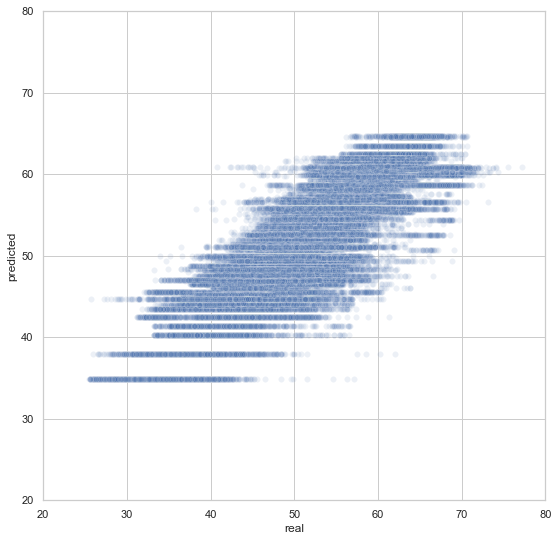

In [62]:
seaborn.set(rc={'figure.figsize':(9,9)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_train.values,ruido_pred_tree,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

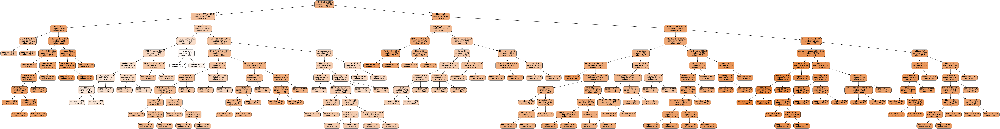

In [63]:
dot_data = StringIO()
export_graphviz(regr_1, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, precision=1,
               feature_names=list(data_features_train.columns),
               impurity=False,
               proportion=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

# Random Forest

In [64]:
from sklearn.ensemble import RandomForestRegressor

In [65]:
rf_model = RandomForestRegressor(n_estimators=100,min_samples_leaf=900)

In [66]:
# Training the data
rf_model.fit(data_features_train.astype(float),data_target_train.astype(float))

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=900,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [125]:
# Make predictions using the train set
ruido_pred_train_rf = rf_model.predict(data_features_train.astype(float))

In [126]:
# Make predictions using the test set
ruido_pred_test_rf = rf_model.predict(data_features_test.astype(float))

In [158]:
print('Train performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_train, ruido_pred_train_rf))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_train, ruido_pred_train_rf,squared=False))
rmse_pct = mean_squared_error(data_target_train, ruido_pred_train_rf,squared=False)/data_target_train.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_train, ruido_pred_train_rf))

print('--------------------------')
print('Test performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_test, ruido_pred_test_rf))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_test, ruido_pred_test_rf,squared=False))
rmse_pct = mean_squared_error(data_target_test, ruido_pred_test_rf,squared=False)/data_target_test.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_test, ruido_pred_test_rf))

Train performance:
Mean squared error: 10.35
RMSE: 3.22
RMSE percentage: 5.95 
R2: 0.76
--------------------------
Test performance:
Mean squared error: 10.34
RMSE: 3.22
RMSE percentage: 5.95 
R2: 0.76


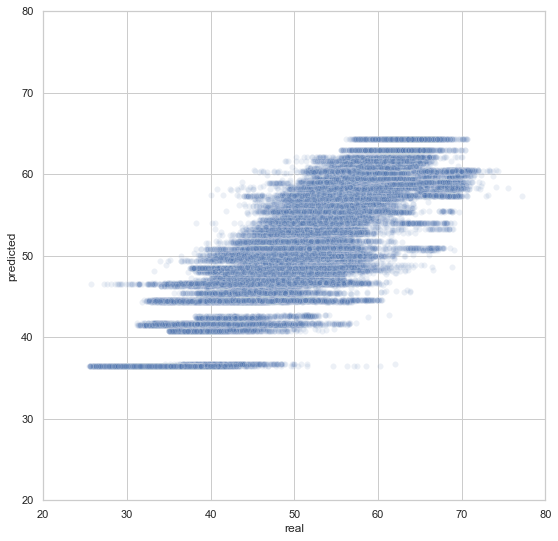

In [69]:
seaborn.set(rc={'figure.figsize':(9,9)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_train.values,ruido_pred_rf,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

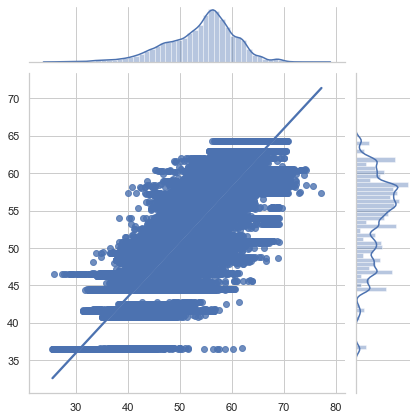

In [70]:
seaborn.jointplot(x=data_target_train.values, y=ruido_pred_rf, kind='reg')
plt.show()

# Gradient boosting

In [71]:
from sklearn.ensemble import GradientBoostingRegressor

In [79]:
for n in [50,100,200]:
    print(n)
    for k in [0.1, 0.2, 0.3, 0.5]:
        print(k,n)
        gb_model = GradientBoostingRegressor(n_estimators=100, min_samples_leaf=1000,random_state=0,max_depth=10, learning_rate=k)
        gb_model.fit(data_features.astype(float),data_target.astype(float))
        ruido_pred_gb = gb_model.predict(data_features.astype(float))
        print('Mean squared error: %.2f'
              % mean_squared_error(data_target, ruido_pred_gb))
        print('RMSE: %.2f'
              %  mean_squared_error(data_target, ruido_pred_gb,squared=False))
        print('R2: %.2f'
              % r2_score(data_target, ruido_pred_gb))



50
0.1 50
Mean squared error: 12.29
RMSE: 3.51
R2: 0.74
0.2 50
Mean squared error: 12.24
RMSE: 3.50
R2: 0.75
0.3 50
Mean squared error: 12.22
RMSE: 3.50
R2: 0.75
0.5 50
Mean squared error: 12.21
RMSE: 3.49
R2: 0.75
100
0.1 100
Mean squared error: 12.29
RMSE: 3.51
R2: 0.74
0.2 100
Mean squared error: 12.24
RMSE: 3.50
R2: 0.75
0.3 100
Mean squared error: 12.22
RMSE: 3.50
R2: 0.75
0.5 100
Mean squared error: 12.21
RMSE: 3.49
R2: 0.75
200
0.1 200
Mean squared error: 12.29
RMSE: 3.51
R2: 0.74
0.2 200
Mean squared error: 12.24
RMSE: 3.50
R2: 0.75
0.3 200
Mean squared error: 12.22
RMSE: 3.50
R2: 0.75
0.5 200
Mean squared error: 12.21
RMSE: 3.49
R2: 0.75


In [72]:
gb_model = GradientBoostingRegressor(n_estimators=100, min_samples_leaf=900,random_state=0,max_depth=10)

In [73]:
# Training data
gb_model.fit(data_features_train.astype(float),data_target_train.astype(float))

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=10,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=900, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=0, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [74]:
# Make predictions using the train set
ruido_pred_train_gb = gb_model.predict(data_features_train.astype(float))

In [75]:
# Make predictions using the test set
ruido_pred_test_gb = gb_model.predict(data_features_test.astype(float))

In [159]:
print('Train performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_train, ruido_pred_train_gb))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_train, ruido_pred_train_gb,squared=False))
rmse_pct = mean_squared_error(data_target_train, ruido_pred_train_gb,squared=False)/data_target_train.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_train, ruido_pred_train_gb))

print('--------------------------')
print('Test performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_test, ruido_pred_test_gb))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_test, ruido_pred_test_gb,squared=False))
rmse_pct = mean_squared_error(data_target_test, ruido_pred_test_gb,squared=False)/data_target_test.mean()*100
print('RMSE percentage: %.2f '
      % rmse_pct )
print('R2: %.2f'
      % r2_score(data_target_test, ruido_pred_test_gb))

Train performance:
Mean squared error: 8.44
RMSE: 2.90
RMSE percentage: 5.37 
R2: 0.80
--------------------------
Test performance:
Mean squared error: 8.49
RMSE: 2.91
RMSE percentage: 5.39 
R2: 0.80


In [77]:
feature_importance = pd.DataFrame()
feature_importance['features'] = list(data_features_train.columns)
feature_importance['importance'] = list(gb_model.feature_importances_)
feature_importance.sort_values('importance',ascending=False)

,features,importance
80,TP9_2_USO,0.269511
0,Hora,0.254648
13,conteo_ips_500m,0.152387
69,TP51POSTGR,0.078383
14,conteo_ips_1km,0.039912
74,TP51_99_ED,0.025253
3,weekday,0.023334
30,TP15_3_OCU,0.019109
41,TP19_EE_E3,0.011751
88,TP9_3_7_NO,0.009469


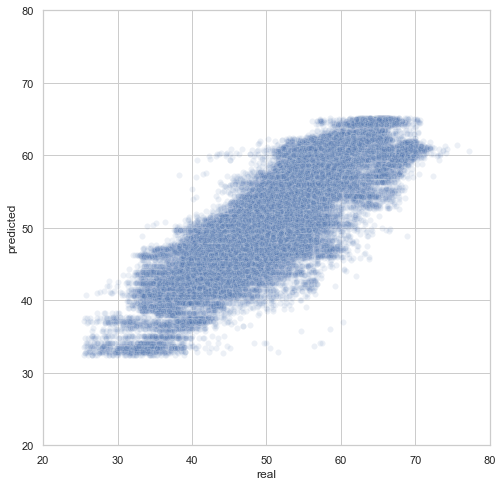

In [78]:
seaborn.set(rc={'figure.figsize':(8,8)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_train.values,ruido_pred_train_gb,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

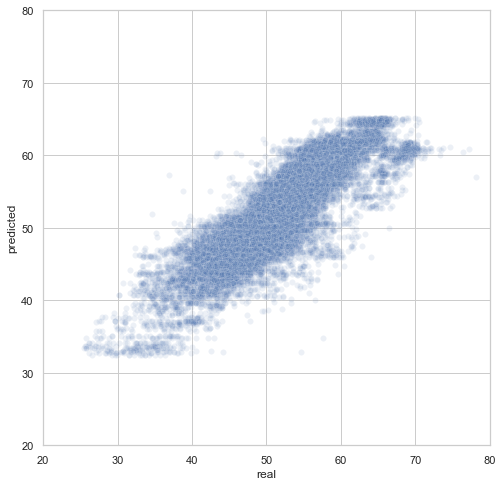

In [79]:
seaborn.set(rc={'figure.figsize':(8,8)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_test.values,ruido_pred_test_gb,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

# Test for each station

In [80]:
test_df = leq_test.copy()

In [81]:
test_df["Valor_mean_pred"] = ruido_pred_test_gb

In [82]:
test_df.head()

,Componente,Estación,Variable,Date_no_hour,Hora,Valor_max,Valor_mean,Valor_median,Valor_min,max-min,...,TP9_3_7_NO,TP9_3_8_NO,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TP9_4_USO,TVIVIENDA,Fecha,weekday,Valor_mean_pred
71464,Ruido,CAI Normandia,Leq,2019-05-17,3,70.7,55.738235,59.75,19.9,50.8,...,7.0,0.0,0.0,0.0,788.0,0.0,3555.0,2019-05-17,5,55.242056
42733,Ruido,CAI Claret,Leq,2020-04-18,23,63.8,48.067647,50.70,18.3,45.5,...,5.0,0.0,5.0,0.0,750.0,0.0,7244.0,2020-04-18,6,53.146815
75601,Ruido,CAI Normandia,Leq,2019-11-10,9,76.2,63.552941,63.20,50.0,26.2,...,7.0,0.0,0.0,0.0,788.0,0.0,3555.0,2019-11-10,7,59.587619
157546,Ruido,Edificio Marly,Leq,2019-06-25,8,61.7,47.258824,51.75,13.3,48.4,...,3.0,1.0,1.0,1.0,756.0,0.0,10295.0,2019-06-25,2,46.594263
75617,Ruido,CAI Normandia,Leq,2019-11-11,1,70.1,55.755882,56.60,29.7,40.4,...,7.0,0.0,0.0,0.0,788.0,0.0,3555.0,2019-11-11,1,52.263643


CAI Normandia
Cantidad de datos a predecir: 2061.00
Test performance:
Mean squared error: 4.61
RMSE: 2.15
R2: 0.67


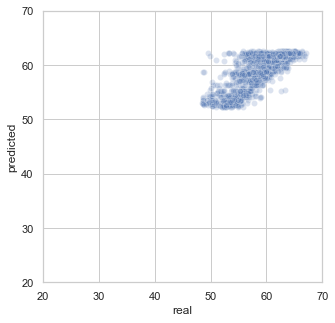

--------------------------
CAI Claret
Cantidad de datos a predecir: 1969.00
Test performance:
Mean squared error: 2.84
RMSE: 1.69
R2: 0.76


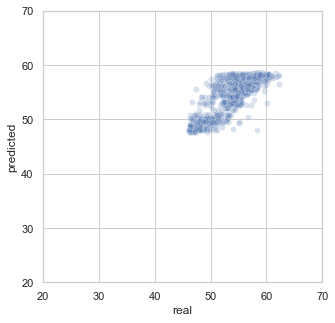

--------------------------
Edificio Marly
Cantidad de datos a predecir: 1843.00
Test performance:
Mean squared error: 10.63
RMSE: 3.26
R2: 0.41


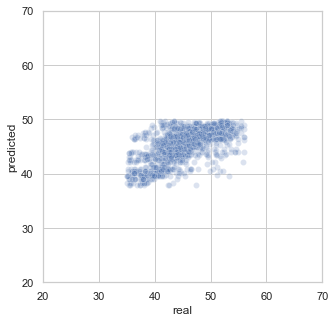

--------------------------
CAI San Victorino
Cantidad de datos a predecir: 961.00
Test performance:
Mean squared error: 8.53
RMSE: 2.92
R2: 0.41


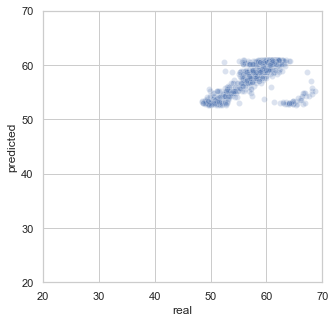

--------------------------
CAI Las Ferias
Cantidad de datos a predecir: 1084.00
Test performance:
Mean squared error: 5.20
RMSE: 2.28
R2: 0.73


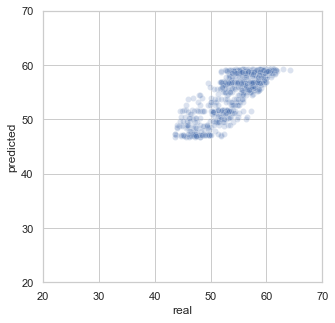

--------------------------
CAI Tejar
Cantidad de datos a predecir: 1353.00
Test performance:
Mean squared error: 3.75
RMSE: 1.94
R2: 0.73


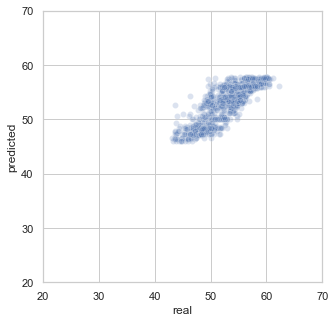

--------------------------
Hotel Morrison
Cantidad de datos a predecir: 1434.00
Test performance:
Mean squared error: 29.50
RMSE: 5.43
R2: 0.18


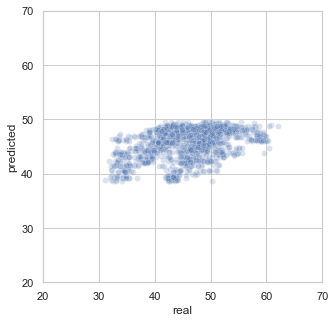

--------------------------
CAI Villa del Prado
Cantidad de datos a predecir: 1159.00
Test performance:
Mean squared error: 3.21
RMSE: 1.79
R2: 0.63


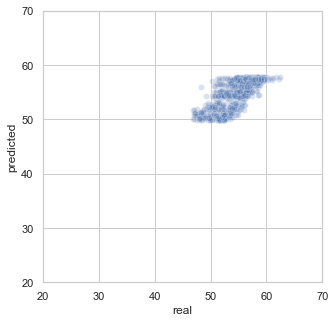

--------------------------
CAI Roma
Cantidad de datos a predecir: 1145.00
Test performance:
Mean squared error: 2.81
RMSE: 1.68
R2: 0.61


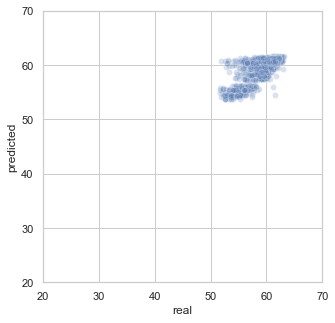

--------------------------
SDA
Cantidad de datos a predecir: 2014.00
Test performance:
Mean squared error: 35.43
RMSE: 5.95
R2: 0.39


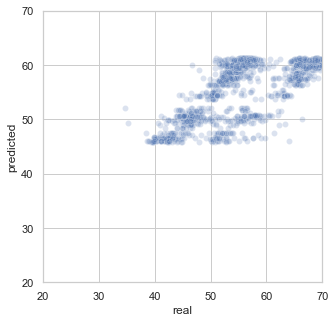

--------------------------
CAI Venecia
Cantidad de datos a predecir: 2074.00
Test performance:
Mean squared error: 3.26
RMSE: 1.81
R2: 0.78


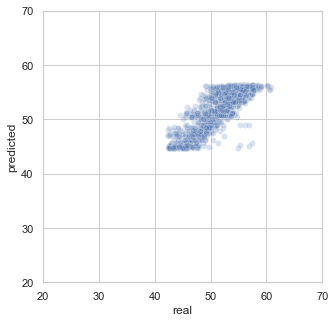

--------------------------
Fontibón
Cantidad de datos a predecir: 1419.00
Test performance:
Mean squared error: 3.87
RMSE: 1.97
R2: 0.41


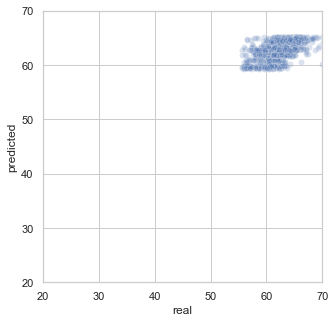

--------------------------
CAI Aurora
Cantidad de datos a predecir: 488.00
Test performance:
Mean squared error: 46.29
RMSE: 6.80
R2: 0.08


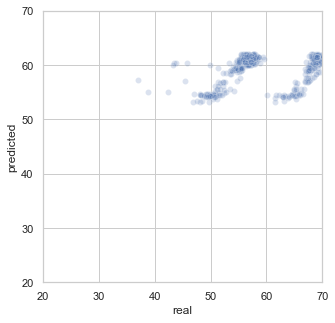

--------------------------
CAI Jaboque
Cantidad de datos a predecir: 1308.00
Test performance:
Mean squared error: 4.26
RMSE: 2.06
R2: 0.73


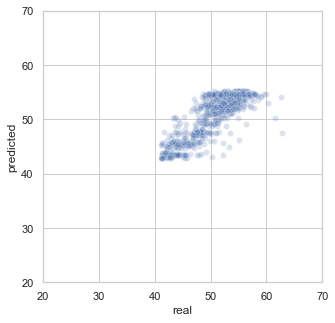

--------------------------
Santa Cecilia
Cantidad de datos a predecir: 2061.00
Test performance:
Mean squared error: 15.90
RMSE: 3.99
R2: 0.70


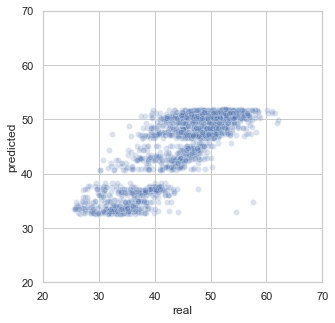

--------------------------
CAI Quirigua
Cantidad de datos a predecir: 1769.00
Test performance:
Mean squared error: 2.66
RMSE: 1.63
R2: 0.66


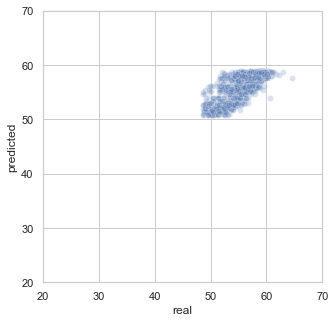

--------------------------
CAI Rincon
Cantidad de datos a predecir: 1923.00
Test performance:
Mean squared error: 5.25
RMSE: 2.29
R2: 0.66


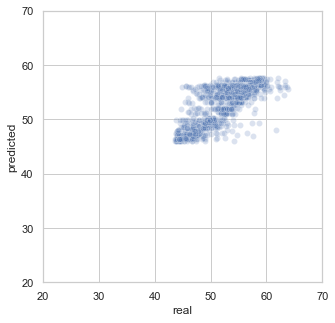

--------------------------
CAI Alamos
Cantidad de datos a predecir: 1984.00
Test performance:
Mean squared error: 4.80
RMSE: 2.19
R2: 0.71


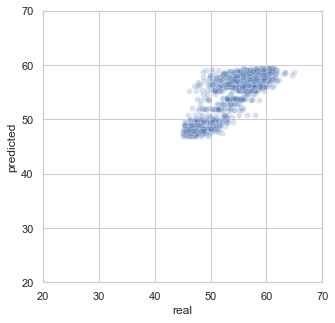

--------------------------
CAI Americas
Cantidad de datos a predecir: 1905.00
Test performance:
Mean squared error: 2.95
RMSE: 1.72
R2: 0.55


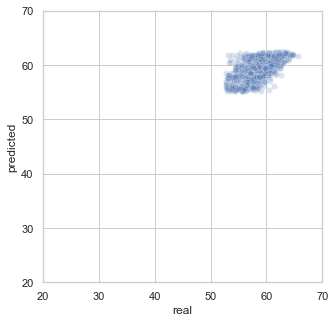

--------------------------
CAI Navarra
Cantidad de datos a predecir: 1195.00
Test performance:
Mean squared error: 2.90
RMSE: 1.70
R2: 0.70


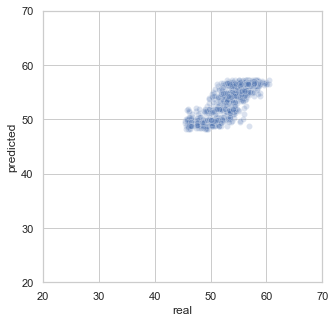

--------------------------
CAI Serena
Cantidad de datos a predecir: 1432.00
Test performance:
Mean squared error: 3.30
RMSE: 1.82
R2: 0.67


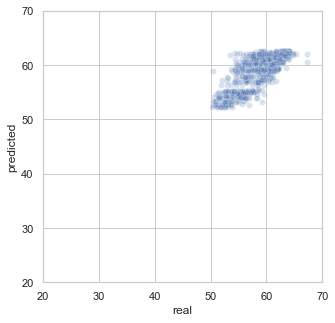

--------------------------
CAI 20 de Julio
Cantidad de datos a predecir: 2101.00
Test performance:
Mean squared error: 6.02
RMSE: 2.45
R2: 0.62


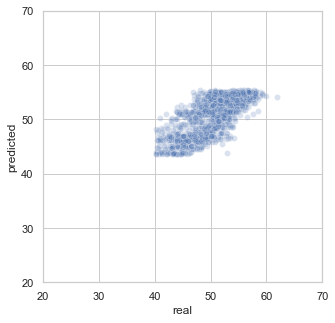

--------------------------
CAI Galerias
Cantidad de datos a predecir: 1352.00
Test performance:
Mean squared error: 5.48
RMSE: 2.34
R2: 0.72


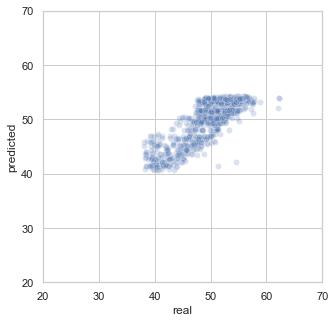

--------------------------
Restrepo
Cantidad de datos a predecir: 1632.00
Test performance:
Mean squared error: 12.00
RMSE: 3.46
R2: 0.36


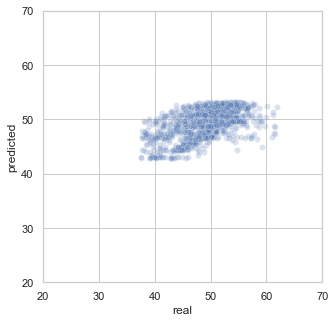

--------------------------
Edificio Profesional
Cantidad de datos a predecir: 1641.00
Test performance:
Mean squared error: 12.49
RMSE: 3.53
R2: 0.26


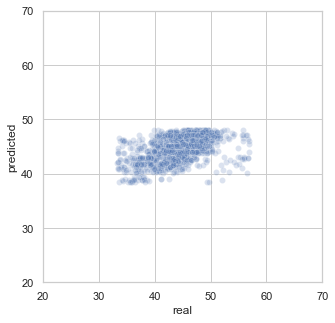

--------------------------
CAI 7 de Agosto
Cantidad de datos a predecir: 279.00
Test performance:
Mean squared error: 1.53
RMSE: 1.24
R2: 0.85


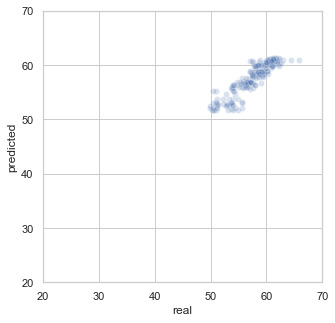

--------------------------
CAI Villa Nidia
Cantidad de datos a predecir: 2128.00
Test performance:
Mean squared error: 3.76
RMSE: 1.94
R2: 0.80


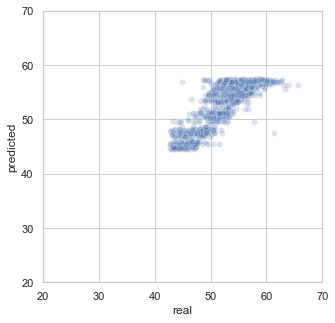

--------------------------
Cruz Roja
Cantidad de datos a predecir: 430.00
Test performance:
Mean squared error: 8.46
RMSE: 2.91
R2: 0.43


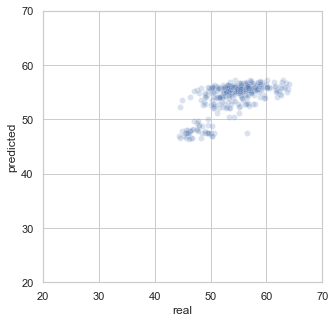

--------------------------
Fin


In [83]:
performance_dict = {}
for station in leq_test['Estación'].unique():
    print(station)
    station_test = leq_test[leq_test.Estación==station]
    datos=len(station_test)
    
    print('Cantidad de datos a predecir: %.2f'%datos)
    data_features_test_station =station_test[features_list]
    data_target_test_station =station_test.Valor_mean
    
    # Make predictions for the station
    station_pred_test_gb = gb_model.predict(data_features_test_station.astype(float))
    
    
    mse=mean_squared_error(data_target_test_station, station_pred_test_gb)
    rmse = mean_squared_error(data_target_test_station, station_pred_test_gb,squared=False)
    r2 = r2_score(data_target_test_station, station_pred_test_gb)
    
    
    perf_dict ={
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'cantidad de datos': datos
    }
    
    performance_dict[station]=perf_dict
    
    print('Test performance:')
    print('Mean squared error: %.2f'%mse)
    print('RMSE: %.2f'%rmse)
    print('R2: %.2f'%r2)
    seaborn.set(rc={'figure.figsize':(5,5)})
    seaborn.set_style("whitegrid")
    ax = seaborn.scatterplot(data_target_test_station.values,station_pred_test_gb,alpha=0.2)
    ax.set(xlabel='real', ylabel='predicted')
    ax.set(xlim=(20,70),ylim=(20,70))

    plt.show()
    print('--------------------------')
    
print("Fin")

In [84]:
performance_df = pd.DataFrame(performance_dict).T

In [85]:
performance_df.sort_values('r2',ascending=False)

,mse,rmse,r2,cantidad de datos
CAI 7 de Agosto,1.525320,1.235039,0.851331,279.0
CAI Villa Nidia,3.762748,1.939780,0.796316,2128.0
CAI Venecia,3.260543,1.805697,0.782961,2074.0
CAI Claret,2.841256,1.685603,0.759486,1969.0
CAI Jaboque,4.262285,2.064530,0.730442,1308.0
CAI Tejar,3.753360,1.937359,0.728556,1353.0
CAI Las Ferias,5.199796,2.280306,0.728071,1084.0
CAI Galerias,5.478358,2.340589,0.721812,1352.0
CAI Alamos,4.804664,2.191954,0.713098,1984.0
CAI Navarra,2.903356,1.703924,0.704426,1195.0


In [86]:
performance_df.sort_values('rmse',ascending=True)

,mse,rmse,r2,cantidad de datos
CAI 7 de Agosto,1.525320,1.235039,0.851331,279.0
CAI Quirigua,2.661129,1.631297,0.661602,1769.0
CAI Roma,2.810287,1.676391,0.606895,1145.0
CAI Claret,2.841256,1.685603,0.759486,1969.0
CAI Navarra,2.903356,1.703924,0.704426,1195.0
CAI Americas,2.952157,1.718184,0.552039,1905.0
CAI Villa del Prado,3.208216,1.791149,0.627947,1159.0
CAI Venecia,3.260543,1.805697,0.782961,2074.0
CAI Serena,3.303866,1.817654,0.674421,1432.0
CAI Tejar,3.753360,1.937359,0.728556,1353.0


# Predict New Locations

In [123]:
nuevas_variables_nuevas_estaciones = pd.read_csv(interim_path + "nuevas_variables_nuevas_estaciones.csv")

In [124]:
nuevas_variables_nuevas_estaciones.head()

,Estación,latitud,longitud,lat_lon,conteo_bares_500m,conteo_bares_1km,conteo_bares_2km,conteo_colegios_500m,conteo_colegios_1km,conteo_colegios_2km,...,TP9_3_4_NO,TP9_3_5_NO,TP9_3_6_NO,TP9_3_7_NO,TP9_3_8_NO,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TP9_4_USO,TVIVIENDA
0,Calle 106,4.692802,-74.056147,"(4.69280155, -74.05614686)",0.0,6.0,83.0,1.0,8.0,41.0,...,0.0,8.0,0.0,10.0,0.0,0.0,0.0,286.0,0.0,4815.0
1,Portal del Norte,4.754472,-74.045965,"(4.75447203, -74.04596522)",1.0,21.0,21.0,6.0,18.0,85.0,...,1.0,18.0,3.0,3.0,0.0,1.0,0.0,451.0,0.0,4472.0
2,AV. El Dorado,4.630262,-74.079769,"(4.63026213, -74.07976893)",0.0,2.0,48.0,9.0,24.0,79.0,...,0.0,46.0,3.0,1.0,0.0,1.0,0.0,549.0,0.0,4707.0
3,Pepe Sierra,4.697859,-74.055313,"(4.69785859, -74.05531281)",0.0,18.0,61.0,1.0,7.0,40.0,...,0.0,3.0,1.0,3.0,0.0,1.0,0.0,263.0,0.0,4975.0
4,Mazurén,4.735471,-74.048970,"(4.73547088, -74.04897041)",0.0,2.0,3.0,4.0,18.0,68.0,...,0.0,15.0,2.0,8.0,0.0,0.0,0.0,261.0,0.0,3918.0


In [193]:
inicio='01/01/2020'
fin='01/08/2020'

lista_dias = pd.date_range(start=inicio, end=fin, freq='1H')[:-1]
data_features_new = pd.DataFrame()
data_features_new['fecha_hora'] = lista_dias
data_features_new['weekday'] = data_features_new.fecha_hora.dt.dayofweek + 1
data_features_new['Hora'] = data_features_new['fecha_hora'].dt.hour
data_features_new.head()

,fecha_hora,weekday,Hora
0,2020-01-01 00:00:00,3,0
1,2020-01-01 01:00:00,3,1
2,2020-01-01 02:00:00,3,2
3,2020-01-01 03:00:00,3,3
4,2020-01-01 04:00:00,3,4


In [199]:
data_features_new_locations = pd.DataFrame()
for station in nuevas_variables_nuevas_estaciones.Estación.unique():
    data_features_station = data_features_new.copy()
    data_features_station["Estación"] = station
    data_features_new_locations = pd.concat([data_features_new_locations,data_features_station])

data_features_new_locations = data_features_new_locations.merge(nuevas_variables_nuevas_estaciones,on='Estación',how='left')


In [200]:
data_features_new_locations_clean = data_features_new_locations[[x for x in features_list if x not in not_useful]]

In [196]:
data_features_new_locations.head()

,Hora,latitud,longitud,weekday,conteo_bares_500m,conteo_bares_1km,conteo_bares_2km,conteo_colegios_500m,conteo_colegios_1km,conteo_colegios_2km,...,TP9_3_3_NO,TP9_3_4_NO,TP9_3_5_NO,TP9_3_6_NO,TP9_3_7_NO,TP9_3_8_NO,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TVIVIENDA
0,0,4.692802,-74.056147,3,0.0,6.0,83.0,1.0,8.0,41.0,...,190.0,0.0,8.0,0.0,10.0,0.0,0.0,0.0,286.0,4815.0
1,1,4.692802,-74.056147,3,0.0,6.0,83.0,1.0,8.0,41.0,...,190.0,0.0,8.0,0.0,10.0,0.0,0.0,0.0,286.0,4815.0
2,2,4.692802,-74.056147,3,0.0,6.0,83.0,1.0,8.0,41.0,...,190.0,0.0,8.0,0.0,10.0,0.0,0.0,0.0,286.0,4815.0
3,3,4.692802,-74.056147,3,0.0,6.0,83.0,1.0,8.0,41.0,...,190.0,0.0,8.0,0.0,10.0,0.0,0.0,0.0,286.0,4815.0
4,4,4.692802,-74.056147,3,0.0,6.0,83.0,1.0,8.0,41.0,...,190.0,0.0,8.0,0.0,10.0,0.0,0.0,0.0,286.0,4815.0


In [201]:
new_ruido_pred_test_gb = gb_model.predict(data_features_new_locations_clean.astype(float))

In [202]:
data_features_new_locations['ruido_pred'] = new_ruido_pred_test_gb

In [203]:
data_features_new_locations.head()

,fecha_hora,weekday,Hora,Estación,latitud,longitud,lat_lon,conteo_bares_500m,conteo_bares_1km,conteo_bares_2km,...,TP9_3_5_NO,TP9_3_6_NO,TP9_3_7_NO,TP9_3_8_NO,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TP9_4_USO,TVIVIENDA,ruido_pred
0,2020-01-01 00:00:00,3,0,Calle 106,4.692802,-74.056147,"(4.69280155, -74.05614686)",0.0,6.0,83.0,...,8.0,0.0,10.0,0.0,0.0,0.0,286.0,0.0,4815.0,42.385712
1,2020-01-01 01:00:00,3,1,Calle 106,4.692802,-74.056147,"(4.69280155, -74.05614686)",0.0,6.0,83.0,...,8.0,0.0,10.0,0.0,0.0,0.0,286.0,0.0,4815.0,41.757616
2,2020-01-01 02:00:00,3,2,Calle 106,4.692802,-74.056147,"(4.69280155, -74.05614686)",0.0,6.0,83.0,...,8.0,0.0,10.0,0.0,0.0,0.0,286.0,0.0,4815.0,41.611667
3,2020-01-01 03:00:00,3,3,Calle 106,4.692802,-74.056147,"(4.69280155, -74.05614686)",0.0,6.0,83.0,...,8.0,0.0,10.0,0.0,0.0,0.0,286.0,0.0,4815.0,42.217612
4,2020-01-01 04:00:00,3,4,Calle 106,4.692802,-74.056147,"(4.69280155, -74.05614686)",0.0,6.0,83.0,...,8.0,0.0,10.0,0.0,0.0,0.0,286.0,0.0,4815.0,43.745256


In [208]:
data_features_new_locations[['Estación','fecha_hora','weekday','Hora','latitud','longitud','ruido_pred']].to_csv('../data/output/predicción nuevas ubicaciones.csv',index=False)

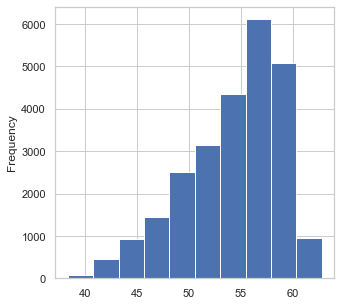

In [205]:
data_features_new_locations.ruido_pred.plot(kind='hist')

# Add Uber Data

In [87]:
traffic_index = pd.read_csv(otros_path + 'cleaned_data/hourly_traffic_index.csv',sep=',')

In [88]:
traffic_index=traffic_index.drop(['Unnamed: 0','UBER_ID'],axis=1)

In [89]:
traffic_index.head(5)

,hod,hourly_traffic_index,Nombre_estacion
0,0.0,-1.276806,CAI 20 de Julio
1,1.0,-1.309597,CAI 20 de Julio
2,2.0,-1.043960,CAI 20 de Julio
3,3.0,-1.224175,CAI 20 de Julio
4,4.0,-0.950977,CAI 20 de Julio


In [90]:
len(merged_df_leq_not_na.Estación.unique())

28

In [91]:
traffic_index.hod=traffic_index.hod.astype('int')

In [92]:
len(traffic_index.Nombre_estacion.unique())

28

In [93]:
merged_df_leq_not_na.columns

Index(['Componente', 'Estación', 'Variable', 'Date_no_hour', 'Hora',
       'Valor_max', 'Valor_mean', 'Valor_median', 'Valor_min', 'max-min',
       ...
       'TP9_3_6_NO', 'TP9_3_7_NO', 'TP9_3_8_NO', 'TP9_3_99_N', 'TP9_3_9_NO',
       'TP9_3_USO', 'TP9_4_USO', 'TVIVIENDA', 'Fecha', 'weekday'],
      dtype='object', length=112)

In [94]:
merged_uber = merged_df_leq_not_na.merge(traffic_index,how='left',left_on=['Estación','Hora'],right_on=['Nombre_estacion','hod'])

In [95]:
merged_uber.head()

,Componente,Estación,Variable,Date_no_hour,Hora,Valor_max,Valor_mean,Valor_median,Valor_min,max-min,...,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TP9_4_USO,TVIVIENDA,Fecha,weekday,hod,hourly_traffic_index,Nombre_estacion
0,Ruido,CAI 20 de Julio,Leq,2019-04-10,1,65.1,63.800000,63.80,62.5,2.6,...,4.0,0.0,1049.0,0.0,3743.0,2019-04-10,3,1,-1.309597,CAI 20 de Julio
1,Ruido,CAI 20 de Julio,Leq,2019-05-08,0,62.2,46.367647,48.80,17.3,44.9,...,4.0,0.0,1049.0,0.0,3743.0,2019-05-08,3,0,-1.276806,CAI 20 de Julio
2,Ruido,CAI 20 de Julio,Leq,2019-05-08,1,59.7,45.020588,46.10,18.2,41.5,...,4.0,0.0,1049.0,0.0,3743.0,2019-05-08,3,1,-1.309597,CAI 20 de Julio
3,Ruido,CAI 20 de Julio,Leq,2019-05-08,2,62.1,45.908824,46.80,17.9,44.2,...,4.0,0.0,1049.0,0.0,3743.0,2019-05-08,3,2,-1.043960,CAI 20 de Julio
4,Ruido,CAI 20 de Julio,Leq,2019-05-08,3,58.2,44.785294,45.35,16.8,41.4,...,4.0,0.0,1049.0,0.0,3743.0,2019-05-08,3,3,-1.224175,CAI 20 de Julio


In [96]:
correlations = merged_uber.corr()

In [97]:
correlations.style.background_gradient(cmap='coolwarm').set_precision(2)

C:\Users\dspinzon\Anaconda3\lib\site-packages\matplotlib\colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
C:\Users\dspinzon\Anaconda3\lib\site-packages\pandas\io\formats\style.py:1089: RuntimeWarning: All-NaN slice encountered
  smin = np.nanmin(s.to_numpy()) if vmin is None else vmin
C:\Users\dspinzon\Anaconda3\lib\site-packages\pandas\io\formats\style.py:1090: RuntimeWarning: All-NaN slice encountered
  smax = np.nanmax(s.to_numpy()) if vmax is None else vmax


In [98]:
# Split Train, and Test Data
leq_train_2, leq_test_2, data_target_train_2, data_target_test_2 = train_test_split(merged_uber,merged_uber.Valor_mean, test_size=0.2, random_state=123)

In [99]:
features_list_2= [
    'Hora', 'latitud', 'longitud', 'weekday', 'conteo_bares_500m',
    'conteo_bares_1km', 'conteo_bares_2km', 'conteo_colegios_500m',
    'conteo_colegios_1km', 'conteo_colegios_2km', 'conteo_hoteles_500m',
    'conteo_hoteles_1km', 'conteo_hoteles_2km', 'conteo_ips_500m',
    'conteo_ips_1km', 'conteo_ips_2km', 'AREA', 'CTNENCUEST', 'DENSIDAD',
    'OBJECTID_1', 'OID', 'PERSONAS_L', 'PERSONAS_S', 'TP14_1_TIP',
    'TP14_2_TIP', 'TP14_3_TIP', 'TP14_4_TIP', 'TP14_5_TIP', 'TP14_6_TIP',
    'TP15_1_OCU', 'TP15_2_OCU', 'TP15_3_OCU', 'TP15_4_OCU', 'TP16_HOG',
    'TP19_ACU_1', 'TP19_ACU_2', 'TP19_ALC_1', 'TP19_ALC_2', 'TP19_EE_1',
    'TP19_EE_2', 'TP19_EE_E1', 'TP19_EE_E2', 'TP19_EE_E3', 'TP19_EE_E4',
    'TP19_EE_E5', 'TP19_EE_E6', 'TP19_EE_E9', 'TP19_GAS_1', 'TP19_GAS_2',
    'TP19_GAS_9', 'TP19_INTE1', 'TP19_INTE2', 'TP19_INTE9', 'TP19_RECB1',
    'TP19_RECB2', 'TP27_PERSO', 'TP32_1_SEX', 'TP32_2_SEX', 'TP34_1_EDA',
    'TP34_2_EDA', 'TP34_3_EDA', 'TP34_4_EDA', 'TP34_5_EDA', 'TP34_6_EDA',
    'TP34_7_EDA', 'TP34_8_EDA', 'TP34_9_EDA', 'TP3A_RI', 'TP3B_TCN',
    'TP3_1_SI', 'TP3_2_NO', 'TP4_1_SI', 'TP4_2_NO', 'TP51POSTGR', 'TP51PRIMAR',
    'TP51SECUND', 'TP51SUPERI', 'TP51_13_ED', 'TP51_99_ED', 'TP9_1_USO',
    'TP9_2_1_MI', 'TP9_2_2_MI', 'TP9_2_3_MI', 'TP9_2_4_MI', 'TP9_2_9_MI',
    'TP9_2_USO', 'TP9_3_10_N', 'TP9_3_1_NO', 'TP9_3_2_NO', 'TP9_3_3_NO',
    'TP9_3_4_NO', 'TP9_3_5_NO', 'TP9_3_6_NO', 'TP9_3_7_NO', 'TP9_3_8_NO',
    'TP9_3_99_N', 'TP9_3_9_NO', 'TP9_3_USO', 'TP9_4_USO', 'TVIVIENDA','hourly_traffic_index'
]

In [100]:
not_useful = ['TP9_4_USO','TP9_2_4_MI','TP3A_RI','TP3B_TCN','TP3_1_SI','PERSONAS_L']

In [101]:
features_list_2  = [x for x in features_list_2 if x not in not_useful]

In [102]:
data_features_train_2 =leq_train_2[features_list_2]
data_features_test_2 =leq_test_2[features_list_2]

## Linear Model

In [103]:
regr_2 = linear_model.LinearRegression()

In [104]:
regr_2.fit(data_features_train_2.astype(float),data_target_train_2.astype(float))

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [105]:
ruido_pred_2 = regr_2.predict(data_features_train_2.astype(float))

In [106]:
# print('Coefficients: \n', regr.coef_)
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_train_2, ruido_pred_2))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_train_2, ruido_pred_2,squared=False))
print('R2: %.2f'
      % r2_score(data_target_train_2, ruido_pred_2))

Mean squared error: 13.35
RMSE: 3.65
R2: 0.68


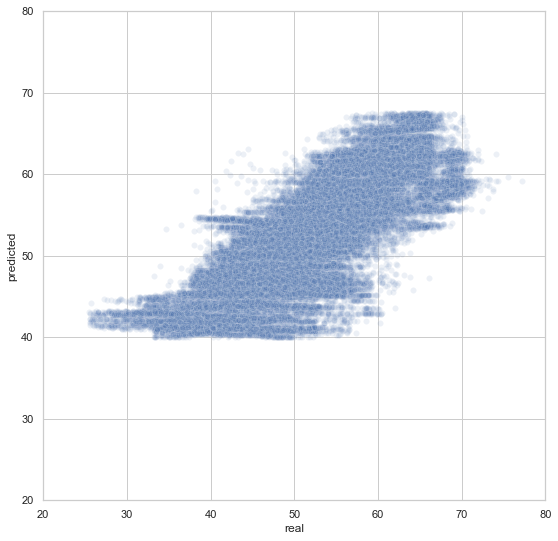

In [107]:
seaborn.set(rc={'figure.figsize':(9,9)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_train_2.values,ruido_pred_2,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

## Gradient Boosting

In [108]:
gb_model_2 = GradientBoostingRegressor(n_estimators=100, 
                                       min_samples_leaf=800,
                                       random_state=0,
                                       max_depth=10
                                      )

In [109]:
# Training data
gb_model_2.fit(data_features_train_2.astype(float),data_target_train_2.astype(float))

GradientBoostingRegressor(alpha=0.9, ccp_alpha=0.0, criterion='friedman_mse',
                          init=None, learning_rate=0.1, loss='ls', max_depth=10,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=800, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='deprecated',
                          random_state=0, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)

In [110]:
# Make predictions using the train set
ruido_pred_train_gb_2 = gb_model_2.predict(data_features_train_2.astype(float))

In [111]:
# Make predictions using the test set
ruido_pred_test_gb_2 = gb_model_2.predict(data_features_test_2.astype(float))

In [112]:
print('Train performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_train_2, ruido_pred_train_gb_2))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_train_2, ruido_pred_train_gb_2,squared=False))
print('R2: %.2f'
      % r2_score(data_target_train_2, ruido_pred_train_gb_2))

print('--------------------------')
print('Test performance:')
print('Mean squared error: %.2f'
      % mean_squared_error(data_target_test_2, ruido_pred_test_gb_2))
print('RMSE: %.2f'
      %  mean_squared_error(data_target_test_2, ruido_pred_test_gb_2,squared=False))
print('R2: %.2f'
      % r2_score(data_target_test_2, ruido_pred_test_gb_2))

Train performance:
Mean squared error: 8.43
RMSE: 2.90
R2: 0.80
--------------------------
Test performance:
Mean squared error: 8.50
RMSE: 2.92
R2: 0.80


In [113]:
feature_importance_2 = pd.DataFrame()
feature_importance_2['features'] = list(data_features_train_2.columns)
feature_importance_2['importance'] = list(gb_model_2.feature_importances_)
feature_importance_2.sort_values('importance',ascending=False)

,features,importance
80,TP9_2_USO,0.266217
13,conteo_ips_500m,0.154450
94,hourly_traffic_index,0.130442
0,Hora,0.128937
69,TP51POSTGR,0.065446
14,conteo_ips_1km,0.043375
74,TP51_99_ED,0.035789
3,weekday,0.023432
30,TP15_3_OCU,0.020613
2,longitud,0.009021


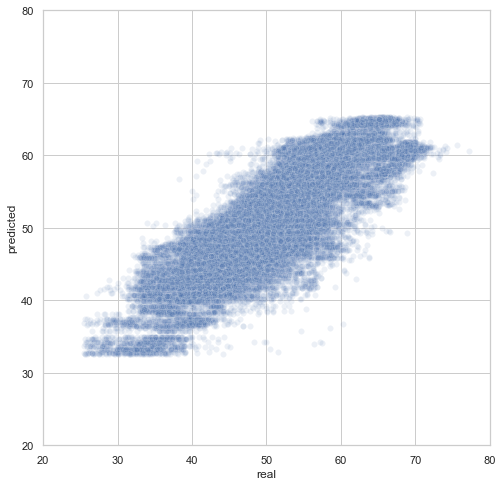

In [114]:
seaborn.set(rc={'figure.figsize':(8,8)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_train_2.values,ruido_pred_train_gb_2,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

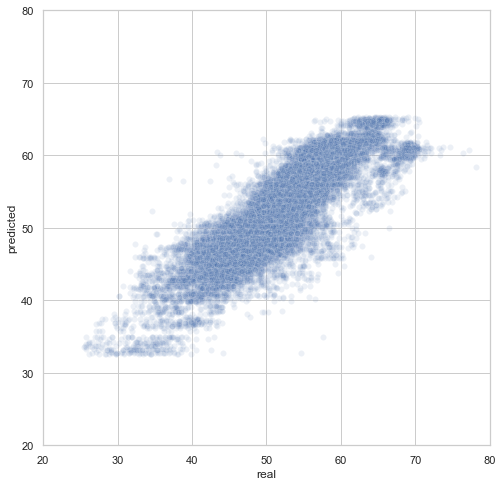

In [115]:
seaborn.set(rc={'figure.figsize':(8,8)})
seaborn.set_style("whitegrid")
ax = seaborn.scatterplot(data_target_test_2.values,ruido_pred_test_gb_2,alpha=0.1)
ax.set(xlabel='real', ylabel='predicted')
ax.set(xlim=(20,80),ylim=(20,80))

plt.show()

## Test for each station

In [116]:
test_df_2 = leq_test_2.copy()

In [117]:
test_df["Valor_mean_pred"] = ruido_pred_test_gb_2

In [118]:
test_df.head()

,Componente,Estación,Variable,Date_no_hour,Hora,Valor_max,Valor_mean,Valor_median,Valor_min,max-min,...,TP9_3_7_NO,TP9_3_8_NO,TP9_3_99_N,TP9_3_9_NO,TP9_3_USO,TP9_4_USO,TVIVIENDA,Fecha,weekday,Valor_mean_pred
71464,Ruido,CAI Normandia,Leq,2019-05-17,3,70.7,55.738235,59.75,19.9,50.8,...,7.0,0.0,0.0,0.0,788.0,0.0,3555.0,2019-05-17,5,55.282186
42733,Ruido,CAI Claret,Leq,2020-04-18,23,63.8,48.067647,50.70,18.3,45.5,...,5.0,0.0,5.0,0.0,750.0,0.0,7244.0,2020-04-18,6,53.328079
75601,Ruido,CAI Normandia,Leq,2019-11-10,9,76.2,63.552941,63.20,50.0,26.2,...,7.0,0.0,0.0,0.0,788.0,0.0,3555.0,2019-11-10,7,59.610384
157546,Ruido,Edificio Marly,Leq,2019-06-25,8,61.7,47.258824,51.75,13.3,48.4,...,3.0,1.0,1.0,1.0,756.0,0.0,10295.0,2019-06-25,2,46.541973
75617,Ruido,CAI Normandia,Leq,2019-11-11,1,70.1,55.755882,56.60,29.7,40.4,...,7.0,0.0,0.0,0.0,788.0,0.0,3555.0,2019-11-11,1,52.066717


CAI Normandia
Cantidad de datos a predecir: 2061.00
Test performance:
Mean squared error: 4.61
RMSE: 2.15
R2: 0.67


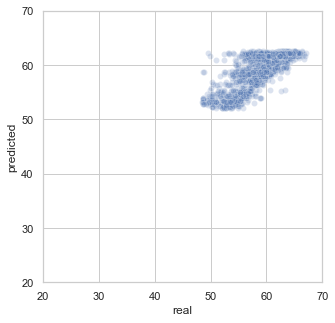

--------------------------
CAI Claret
Cantidad de datos a predecir: 1969.00
Test performance:
Mean squared error: 2.86
RMSE: 1.69
R2: 0.76


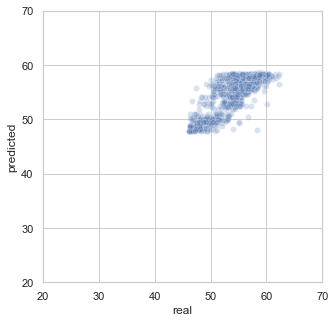

--------------------------
Edificio Marly
Cantidad de datos a predecir: 1843.00
Test performance:
Mean squared error: 10.68
RMSE: 3.27
R2: 0.40


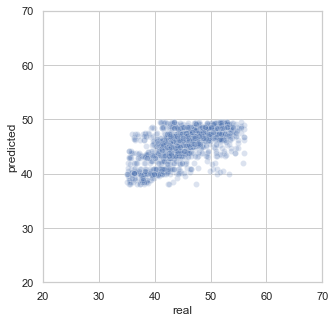

--------------------------
CAI San Victorino
Cantidad de datos a predecir: 961.00
Test performance:
Mean squared error: 8.53
RMSE: 2.92
R2: 0.41


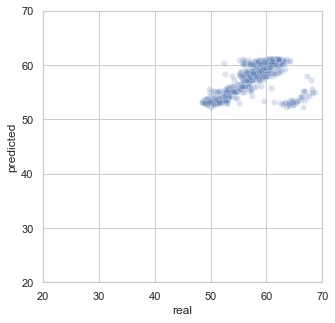

--------------------------
CAI Las Ferias
Cantidad de datos a predecir: 1084.00
Test performance:
Mean squared error: 5.19
RMSE: 2.28
R2: 0.73


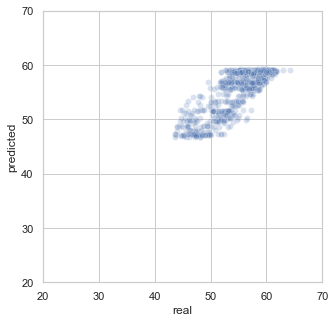

--------------------------
CAI Tejar
Cantidad de datos a predecir: 1353.00
Test performance:
Mean squared error: 3.76
RMSE: 1.94
R2: 0.73


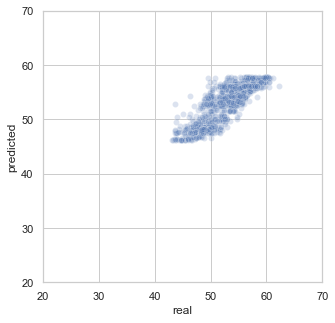

--------------------------
Hotel Morrison
Cantidad de datos a predecir: 1434.00
Test performance:
Mean squared error: 29.53
RMSE: 5.43
R2: 0.18


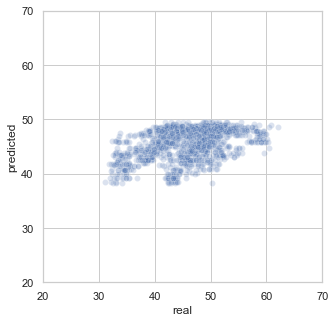

--------------------------
CAI Villa del Prado
Cantidad de datos a predecir: 1159.00
Test performance:
Mean squared error: 3.23
RMSE: 1.80
R2: 0.63


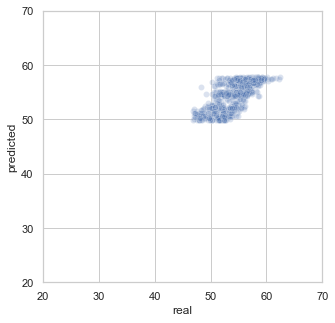

--------------------------
CAI Roma
Cantidad de datos a predecir: 1145.00
Test performance:
Mean squared error: 2.84
RMSE: 1.68
R2: 0.60


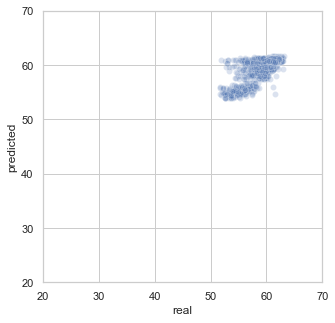

--------------------------
SDA
Cantidad de datos a predecir: 2014.00
Test performance:
Mean squared error: 35.44
RMSE: 5.95
R2: 0.39


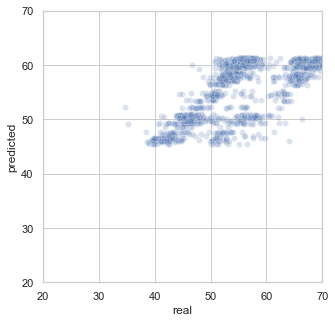

--------------------------
CAI Venecia
Cantidad de datos a predecir: 2074.00
Test performance:
Mean squared error: 3.26
RMSE: 1.80
R2: 0.78


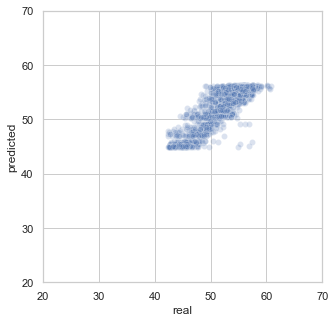

--------------------------
Fontibón
Cantidad de datos a predecir: 1419.00
Test performance:
Mean squared error: 3.89
RMSE: 1.97
R2: 0.41


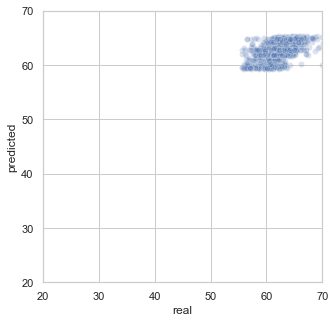

--------------------------
CAI Aurora
Cantidad de datos a predecir: 488.00
Test performance:
Mean squared error: 46.30
RMSE: 6.80
R2: 0.08


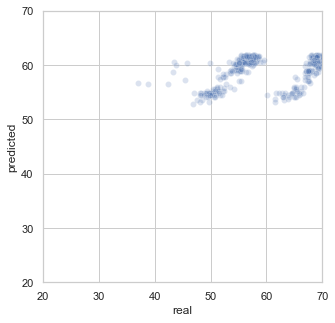

--------------------------
CAI Jaboque
Cantidad de datos a predecir: 1308.00
Test performance:
Mean squared error: 4.28
RMSE: 2.07
R2: 0.73


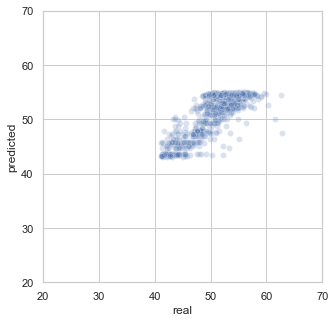

--------------------------
Santa Cecilia
Cantidad de datos a predecir: 2061.00
Test performance:
Mean squared error: 15.96
RMSE: 3.99
R2: 0.69


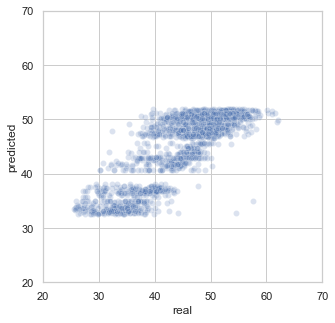

--------------------------
CAI Quirigua
Cantidad de datos a predecir: 1769.00
Test performance:
Mean squared error: 2.65
RMSE: 1.63
R2: 0.66


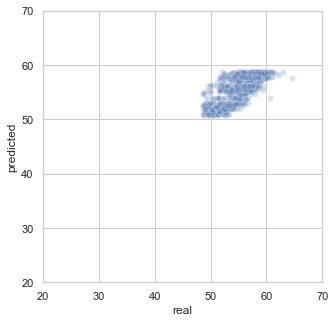

--------------------------
CAI Rincon
Cantidad de datos a predecir: 1923.00
Test performance:
Mean squared error: 5.26
RMSE: 2.29
R2: 0.66


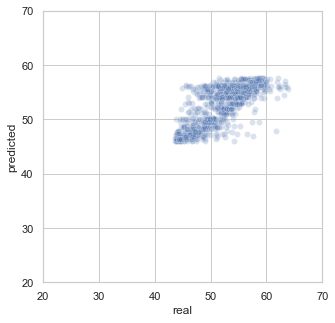

--------------------------
CAI Alamos
Cantidad de datos a predecir: 1984.00
Test performance:
Mean squared error: 4.80
RMSE: 2.19
R2: 0.71


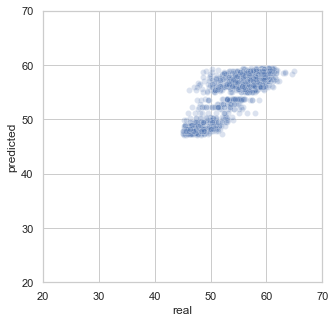

--------------------------
CAI Americas
Cantidad de datos a predecir: 1905.00
Test performance:
Mean squared error: 2.97
RMSE: 1.72
R2: 0.55


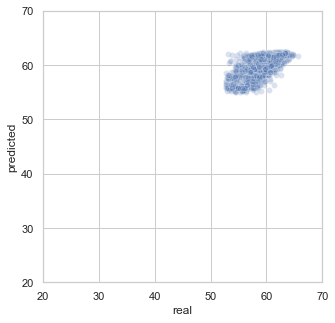

--------------------------
CAI Navarra
Cantidad de datos a predecir: 1195.00
Test performance:
Mean squared error: 2.92
RMSE: 1.71
R2: 0.70


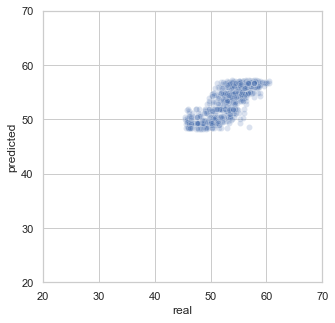

--------------------------
CAI Serena
Cantidad de datos a predecir: 1432.00
Test performance:
Mean squared error: 3.33
RMSE: 1.82
R2: 0.67


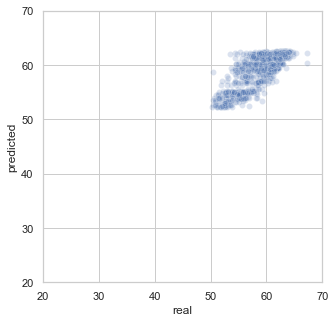

--------------------------
CAI 20 de Julio
Cantidad de datos a predecir: 2101.00
Test performance:
Mean squared error: 5.99
RMSE: 2.45
R2: 0.63


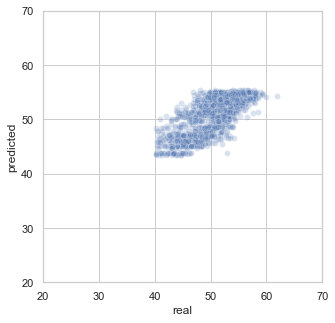

--------------------------
CAI Galerias
Cantidad de datos a predecir: 1352.00
Test performance:
Mean squared error: 5.50
RMSE: 2.35
R2: 0.72


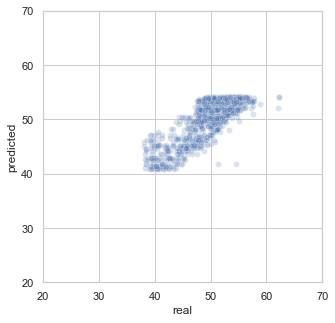

--------------------------
Restrepo
Cantidad de datos a predecir: 1632.00
Test performance:
Mean squared error: 11.99
RMSE: 3.46
R2: 0.36


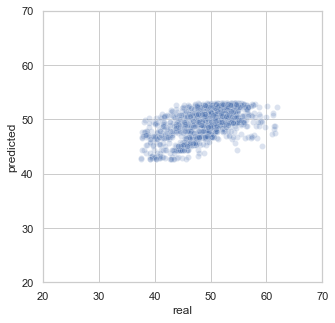

--------------------------
Edificio Profesional
Cantidad de datos a predecir: 1641.00
Test performance:
Mean squared error: 12.46
RMSE: 3.53
R2: 0.27


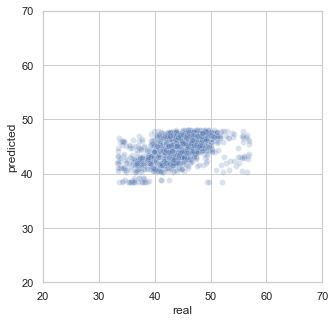

--------------------------
CAI 7 de Agosto
Cantidad de datos a predecir: 279.00
Test performance:
Mean squared error: 1.48
RMSE: 1.22
R2: 0.86


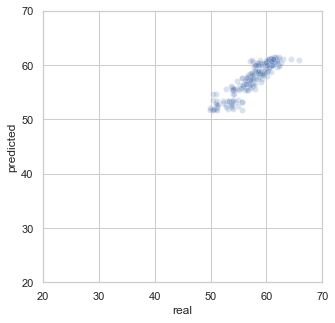

--------------------------
CAI Villa Nidia
Cantidad de datos a predecir: 2128.00
Test performance:
Mean squared error: 3.77
RMSE: 1.94
R2: 0.80


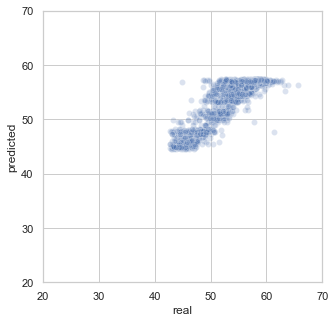

--------------------------
Cruz Roja
Cantidad de datos a predecir: 430.00
Test performance:
Mean squared error: 8.56
RMSE: 2.93
R2: 0.42


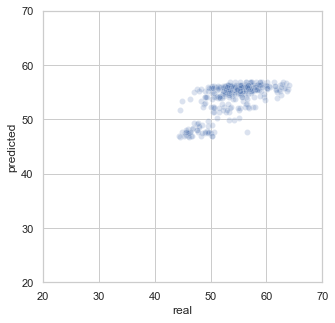

--------------------------
Fin


In [119]:
performance_dict_2 = {}
for station in leq_test_2['Estación'].unique():
    print(station)
    station_test= leq_test_2[leq_test_2.Estación==station]
    datos=len(station_test)
    
    print('Cantidad de datos a predecir: %.2f'%datos)
    data_features_test_station =station_test[features_list_2]
    data_target_test_station =station_test.Valor_mean
    
    # Make predictions for the station
    station_pred_test_gb = gb_model_2.predict(data_features_test_station.astype(float))
    
    
    mse=mean_squared_error(data_target_test_station, station_pred_test_gb)
    rmse = mean_squared_error(data_target_test_station, station_pred_test_gb,squared=False)
    r2 = r2_score(data_target_test_station, station_pred_test_gb)
    
    
    perf_dict ={
        'mse': mse,
        'rmse': rmse,
        'r2': r2,
        'cantidad de datos': datos
    }
    
    performance_dict_2[station]=perf_dict
    
    print('Test performance:')
    print('Mean squared error: %.2f'%mse)
    print('RMSE: %.2f'%rmse)
    print('R2: %.2f'%r2)
    seaborn.set(rc={'figure.figsize':(5,5)})
    seaborn.set_style("whitegrid")
    ax = seaborn.scatterplot(data_target_test_station.values,station_pred_test_gb,alpha=0.2)
    ax.set(xlabel='real', ylabel='predicted')
    ax.set(xlim=(20,70),ylim=(20,70))

    plt.show()
    print('--------------------------')
    
print("Fin")

In [120]:
performance_df_2 = pd.DataFrame(performance_dict_2).T

In [121]:
performance_df_2.sort_values('r2',ascending=False)

,mse,rmse,r2,cantidad de datos
CAI 7 de Agosto,1.484513,1.218406,0.855308,279.0
CAI Villa Nidia,3.766847,1.940837,0.796094,2128.0
CAI Venecia,3.256579,1.804599,0.783225,2074.0
CAI Claret,2.856096,1.689999,0.758229,1969.0
CAI Jaboque,4.280319,2.068893,0.729301,1308.0
CAI Las Ferias,5.193125,2.278843,0.728419,1084.0
CAI Tejar,3.764903,1.940336,0.727721,1353.0
CAI Galerias,5.501735,2.345578,0.720625,1352.0
CAI Alamos,4.801579,2.191251,0.713282,1984.0
CAI Navarra,2.923108,1.709710,0.702415,1195.0


In [122]:
performance_df_2.sort_values('rmse',ascending=True)

,mse,rmse,r2,cantidad de datos
CAI 7 de Agosto,1.484513,1.218406,0.855308,279.0
CAI Quirigua,2.652467,1.628640,0.662704,1769.0
CAI Roma,2.835197,1.683804,0.603411,1145.0
CAI Claret,2.856096,1.689999,0.758229,1969.0
CAI Navarra,2.923108,1.709710,0.702415,1195.0
CAI Americas,2.966862,1.722458,0.549808,1905.0
CAI Villa del Prado,3.230572,1.797379,0.625355,1159.0
CAI Venecia,3.256579,1.804599,0.783225,2074.0
CAI Serena,3.326926,1.823986,0.672149,1432.0
CAI Tejar,3.764903,1.940336,0.727721,1353.0
